## Dog Breed Image Classification
#### Using the Stanford Dogs Dataset

### Problem: Can I build a model that accurately predicts dog breeds?/ "What kind of dog IS this?!"

## Imports:

In [1]:
import numpy as np
import pandas as pd 
import os
from shutil import copyfile

import random
from itertools import chain

from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator

from keras.applications.inception_v3 import preprocess_input
# from keras.preprocessing.image import ImageDataGenerator

import matplotlib.pyplot as plt
%matplotlib inline 

# For reproducibility
np.random.seed(42)


#### Extracting the large dataset. Over 2GB of data.

#### The dataset used ended up being the Stanford Dogs Dataset.

##### Dataset used(source of .tar files to extract the data) http://vision.stanford.edu/aditya86/ImageNetDogs/

##### There is a smaller dataset used as a kaggle competition but I decided to stick with the bigger dataset for a bit more of a challenge.

In [2]:
# Extracting tar file containing all 20,580 images

# import tarfile
# images_tar = tarfile.open('images.tar')
# images_tar.extractall('./images') # specify which folder to extract to
# images_tar.close()

In [3]:
# Extracting annotations for each breed/image

# annot_tar = tarfile.open('annotation.tar')
# annot_tar.extractall('./annotation') # specify which folder to extract to
# annot_tar.close()

In [4]:
# lists_tar = tarfile.open('lists.tar')
# lists_tar.extractall('./lists') # specify which folder to extract to
# lists_tar.close()

In [5]:
# Displaying all folder(breed) names
print(os.listdir('/Users/Burger/Documents/dsir/Submissions/Capstone/images/Images'))
dog_classes = os.listdir('/Users/Burger/Documents/dsir/Submissions/Capstone/images/Images')

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

In [6]:
# In order to have proper labels (the breeds), will need to 
# split up the folder names as shown above. Only want breed name as the label:

# Splitting at the dash, so we only retrieve the breed name.
breeds = [breed.split('-',1)[1] for breed in dog_classes]
breeds[:10] 

['Chihuahua',
 'Japanese_spaniel',
 'Maltese_dog',
 'Pekinese',
 'Shih-Tzu',
 'Blenheim_spaniel',
 'papillon',
 'toy_terrier',
 'Rhodesian_ridgeback',
 'Afghan_hound']


## Data Pre-Processing

### Creating X and y variables
##### X = Full path of the images
##### y = Breed name/label of the images

In [7]:
# Saving full path of the image(s) to X and just the breed name to y:

X = [] # Full path of image(s)
y = [] # Breed name of corresponding image / labels

imgpath = ['/Users/Burger/Documents/dsir/Submissions/Capstone/images/Images/{}'.format(dog_class) for dog_class in dog_classes]

for counter, fullpath in enumerate(imgpath):
    for imgname in os.listdir(fullpath):
        X.append([fullpath + '/' + imgname])
        y.append(breeds[counter])

X = list(chain.from_iterable(X)) 
# un-nesting the lists and joining together into one list

In [8]:
len(X) 
# displaying total number of pictures -- 20,500

20580

### I was unable to use my computer to run my models on over 20k images. Below is what I ended up doing in order to have a functioning model:

Randomly shuffling the images. As I am only able to use about 7k images at a time, I prefer that they be randomized instead of having the dog images already grouped together by their breed.

In [9]:
# shuffling X and y
combined = list(zip(X, y))
random.shuffle(combined)

X[:], y[:] = zip(*combined)

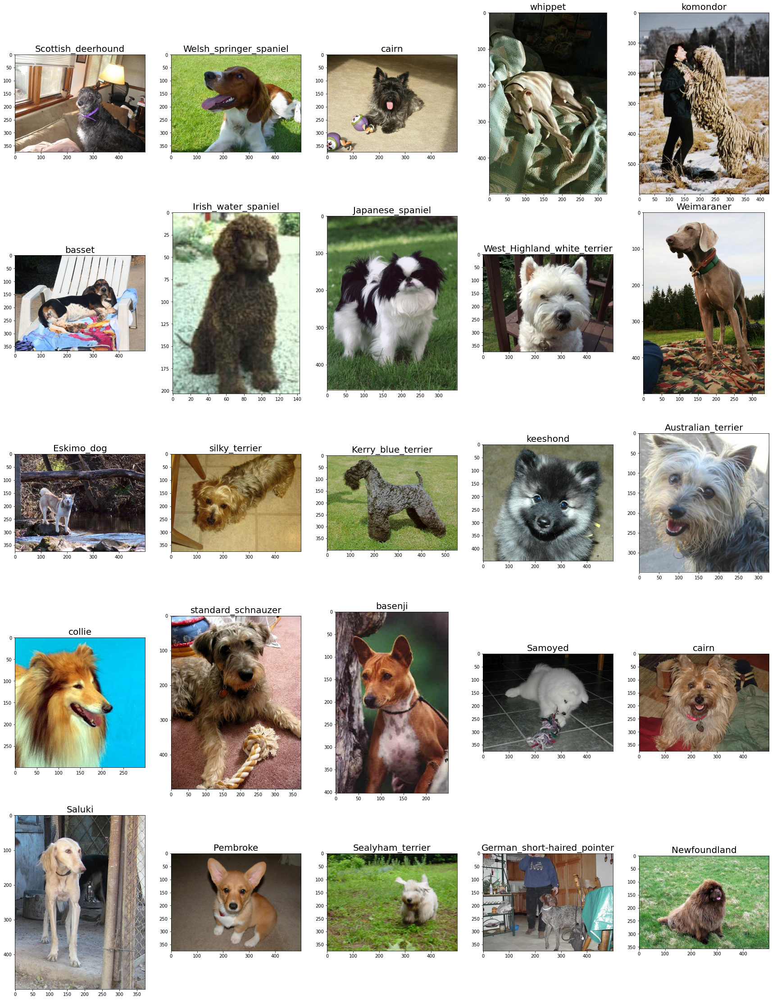

In [10]:
# Displaying a sample batch of images from the dataset as examples 
from matplotlib.image import imread

plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(X)), 25)): # random 25 images
    plt.subplot(5, 5, counter+1)
    plt.subplots_adjust(hspace=0.1)
    filename = X[i]
    image = imread(filename)
    plt.imshow(image)
    plt.title(y[i], fontsize=20)

plt.show()

As these images do not have the same dimensions, they will eventually need to be resized before attempting a model.
Also, I chose to go with an image count of 7,000 (after shuffling) to run through my model, so I could actually do so with my own PC:

In [11]:
# Choosing a subset of 7k as my processor could not handle 20k 
# and I do still get good results from this

X = X[:7000] # through 7000th image(after randomization)
y = y[:7000] # through 7000th breed name(after randomization)

ENCODING DATA

In [12]:
# Labelencoding / one-hot encoding y labels (dog breeds)
# Label Encoder simply assigns a numeric value to each breed name
le = LabelEncoder()
le.fit(y)
y_ohe = to_categorical(le.transform(y), len(breeds))
y_ohe = np.array(y_ohe)

Loading all images to have the same dimensions and converting into an image array, containing the rgb value of each pixel.

##### Resized images to 299 x 299 per the Inception V3 documentation... Was getting great results(that i did screenshot), but image was near clear and models took extremely long to run
##### Ultimately, I Reduced by 20% to 180 x 180 and sticking with it as accuracy stil pretty good and the model is actually working on an image that isn't very clear
##### - I also did 28x28, but even with 1000 epochs, the results were abysmal

Prepping Train/Test Split for preparing training, testing and validation data:

In [13]:
img_data = np.array([img_to_array(load_img(img, target_size = (150,150)))
                     for img in X]) 
# loading/resizing images, and storing as array

# Train/Test Splits for training, testing and validation data
X_train, X_test, y_train, y_test = train_test_split(img_data, y_ohe,
                                                   test_size = 0.2,
                                                   stratify=np.array(y), # stratify makes sure that proportion of each class in the output is same as the input
                                                   random_state = 2) 

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train,
                                                 test_size = 0.2,
                                                 stratify=np.array(y_train),
                                                 random_state = 2)
# displaying their shapes:
print('Training Dataset Size: ', X_train.shape)
print('Validation Dataset Size: ', X_val.shape)
print('Testing Dataset Size: ', X_test.shape)
print('Training Label Size: ', y_train.shape)
print('Validation Label Size: ', y_val.shape)
print('Testing Label Size: ', y_test.shape)

# clearing some space from memory
import gc
del img_data
gc.collect()

Training Dataset Size:  (4480, 150, 150, 3)
Validation Dataset Size:  (1120, 150, 150, 3)
Testing Dataset Size:  (1400, 150, 150, 3)
Training Label Size:  (4480, 120)
Validation Label Size:  (1120, 120)
Testing Label Size:  (1400, 120)


63057

Here, You can see that there are 4480 training, 1120 validation and 1400 testing images. Each image has dimensions of 180x180, with 3 channels to represent RGB.

-------------------------------

### Data(image) Augmentation
##### I have also decided to perform some data augmentation, primarily due to the fact that I was not able to use the entire dataset, locally anyway. The reason for doing this is that it applies some type of transformation(s) to the images, such as rotating or flipping them, to provide more diverse data to train the model. (I ran the model before doing this and it did not work nearly as well when running smaller data subsets.)

In [14]:
# Img Augmentation and Creating Training and Validation Generators

# Setting Batch size to 32 -- anything more causes the model to take way too long
# or it will just freeze up...Though higher batch sizes did provide better results.
batch_size = 32
# per InceptionV3 doc, batch size of 32 is best for well-running/performing models

# Creating a train generator
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, # only use rescale=1./255 if training from scratch
                                  rotation_range = 30,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  horizontal_flip = True) # CHECK

train_generator = train_datagen.flow(X_train, y_train,
                                     shuffle = False, batch_size = batch_size, seed = 1)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input) # do not augment validation data

val_generator = val_datagen.flow(X_val, y_val,
                                shuffle = False, batch_size = batch_size, seed = 1)

#### Example of augmented image
##### As you can see, this has split one image up into multiples by rotating/flipping the images to get different angles for better training on smaller datasets-BEST FOR SMALLER SETS OF DATA, as it increases the size of the training data overall

##### I ended up attempting models with and without using this...using them clearly provides higher accuracies but that only seems to be with smaller datasets while Surprisingly, Larger datasets functioned better without augmenting data

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


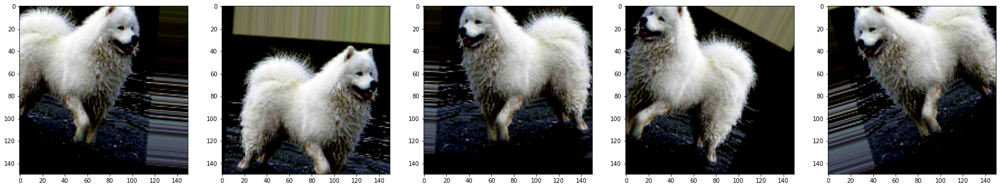

In [15]:
# displaying an augmented image(any ID# can be put in below)
img_id = 13

dog_generator = train_datagen.flow(X_train[img_id:img_id+1], y_train[img_id:img_id+1],
                                     shuffle = False, batch_size = batch_size, seed = 1)

plt.figure(figsize=(30,20))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs): 
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
    #plt.axis('off')
    
plt.show()



------------------------------

## MODELING

The next part is building the model. For this process, I ended up using Google's Inception V3 model as the pre-trained model/base layer. (There are other models available to use in Keras as well.)

In [16]:
# Model imports:
from keras import models
from keras import layers
from keras.optimizers import Adam
from keras.layers import GlobalAveragePooling2D, Dense, Flatten, Dropout
from keras.applications.inception_v3 import InceptionV3
from keras.utils.np_utils import to_categorical
from keras.utils.vis_utils import plot_model

In [17]:
# Modeling using pre-trained InceptionV3 as the base,
# Global average pooling to pool the data(better results than Conv2D) and
# flattening the images


# load InceptionV3 pre-trained model
base_model = InceptionV3(weights = 'imagenet', include_top = False, input_shape = (150,150,3))

model = models.Sequential()
model.add(base_model) # add pre_trained layers
model.add(GlobalAveragePooling2D())
model.add(Flatten()) 
# flatten to 1-D vector to prepare for fully connected layers
model.add(Dropout(0.3))
model.add(Dense(512, activation = 'relu')) # both with 512nodes and relu
model.add(Dense(256, activation = 'relu'))
model.add(Dense(len(breeds), activation = 'softmax')) # Final @ 120nodes w/ softmax


In [18]:
# Compiling the Model and showing a summary

model.compile(Adam(lr=.0001), loss='categorical_crossentropy', metrics=['accuracy']) 
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inception_v3 (Functional)    (None, 3, 3, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
flatten (Flatten)            (None, 2048)              0         
_________________________________________________________________
dropout (Dropout)            (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               1049088   
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_2 (Dense)              (None, 120)               3

In [19]:
# I followed all instructions for pydot and graphviz but was still unable to get
# this visualization...
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


### Training the Model

When training the model, I attempted several different base-layers as well as batch size #s. I quickly found out that the higher the batch size, the model takes substantially more time to run but it gave my best results. After a bit more research, I found that the best # to use for the batch size is generally 32, as that amount of samples doesn't strain the process. Speed greatly increased after changing the batch size to 32 but, again, the models do not perform quite as well.

In [20]:
# Model w/ 10 Epochs

train_steps = X_train.shape[0] // batch_size
val_steps = X_val.shape[0] // batch_size
epochs = 10

history2 = model.fit(train_generator,
                             steps_per_epoch = train_steps,
                             validation_data = val_generator,
                             validation_steps = val_steps,
                             epochs = epochs, verbose = 1)

Epoch 1/10
140/140 [==============================] - 260s 2s/step - loss: 4.6166 - accuracy: 0.0455 - val_loss: 3.9028 - val_accuracy: 0.1580
Epoch 2/10
140/140 [==============================] - 260s 2s/step - loss: 3.7586 - accuracy: 0.1792 - val_loss: 3.0319 - val_accuracy: 0.2911
Epoch 3/10
140/140 [==============================] - 260s 2s/step - loss: 2.7942 - accuracy: 0.3326 - val_loss: 2.5688 - val_accuracy: 0.3741
Epoch 4/10
140/140 [==============================] - 257s 2s/step - loss: 2.0859 - accuracy: 0.4580 - val_loss: 2.2728 - val_accuracy: 0.4321
Epoch 5/10
140/140 [==============================] - 255s 2s/step - loss: 1.6173 - accuracy: 0.5598 - val_loss: 2.2401 - val_accuracy: 0.4321
Epoch 6/10
140/140 [==============================] - 254s 2s/step - loss: 1.2927 - accuracy: 0.6413 - val_loss: 2.0794 - val_accuracy: 0.4768
Epoch 7/10
140/140 [==============================] - 255s 2s/step - loss: 1.0294 - accuracy: 0.7152 - val_loss: 2.2546 - val_accuracy: 0.4554

85.6% training / 88.6% testing accuracy when dims are 299x299. 
When 180x180: 76.3% training and 77.3% testing / 66.5% training and 70.45% testing. Even only using 10 Epochs, this turned out to be my best performing model after adjusting base layer, batch size, data augmentation and size, etc. (I tried many things with this model)

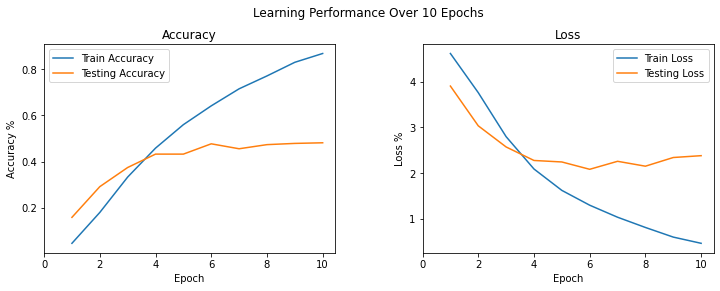

In [21]:
# Plotting Accuracy and Loss of first model to visually check performance

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Learning Performance Over 10 Epochs', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1,))
ax1.plot(epoch_list, history2.history['accuracy'], label='Train Accuracy')
ax1.plot(epoch_list, history2.history['val_accuracy'], label='Testing Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 2))
ax1.set_ylabel('Accuracy %')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history2.history['loss'], label='Train Loss')
ax2.plot(epoch_list, history2.history['val_loss'], label='Testing Loss')
ax2.set_xticks(np.arange(0, epochs+1, 2))
ax2.set_ylabel('Loss %')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

The best performance was at the 9th epoch, with the lowest amount of overfitting and a decent accuracy percentage.

In [22]:
# Fitting Model w/ 20 Epochs

train_steps = X_train.shape[0] // batch_size
val_steps = X_val.shape[0] // batch_size
epochs = 20

history = model.fit_generator(train_generator,
                             steps_per_epoch = train_steps,
                             validation_data = val_generator,
                             validation_steps = val_steps,
                             epochs = epochs, verbose = 1)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/20
140/140 [==============================] - 253s 2s/step - loss: 0.3628 - accuracy: 0.8973 - val_loss: 2.4014 - val_accuracy: 0.4929
Epoch 2/20
140/140 [==============================] - 255s 2s/step - loss: 0.3158 - accuracy: 0.9145 - val_loss: 2.4385 - val_accuracy: 0.4893
Epoch 3/20
140/140 [==============================] - 254s 2s/step - loss: 0.2289 - accuracy: 0.9386 - val_loss: 2.6340 - val_accuracy: 0.4920
Epoch 4/20
140/140 [==============================] - 254s 2s/step - loss: 0.2120 - accuracy: 0.9429 - val_loss: 2.6684 - val_accuracy: 0.4893
Epoch 5/20
140/140 [==============================] - 255s 2s/step - loss: 0.1768 - accuracy: 0.9498 - val_loss: 2.6779 - val_accuracy: 0.4866
Epoch 6/20
140/140 [==============================] - 255s 2s/step - loss: 0.1586 - accuracy: 0.9542 - val_loss: 2.7791 - val_accuracy: 0.4688
Epoch 7/20
140/140 [==============================] - 256s 2s/step

Final Performance: At dimensions of 299x299: 94.2% training accuracy 92.7% testing accuracy // at 180x180: 81.92% training accuracy and 76.61% testing accuracy
* When restarting kernel and running all cells before submitting all of this, each epoch is now taking nearly 5 mins each... So, in order to get it in on time, I will be turning this version in and letting the 100-epoch model run overnight, turning the final version in as soon as it completed. I'm not sure WHY this happened, however, the training accuracy is now showing to be over 96%...then again, testing accuracy is hovering around 43-46%(WAY overfit). Just something interesting to note at this point in time. To Be Continued...

-----------------------------------------------
---------------------------------------------
---------------------------------------------

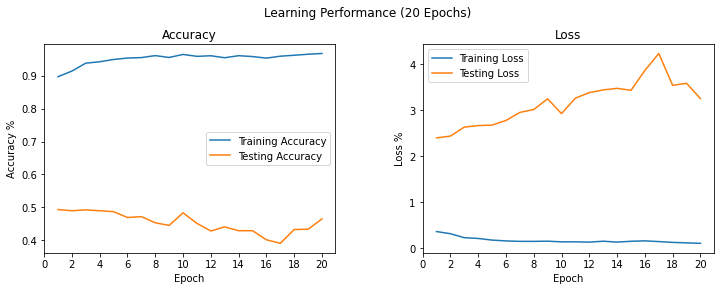

In [23]:
# Plot Accuracy and Loss to visually view performance of this model

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Learning Performance (20 Epochs)', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1))
ax1.plot(epoch_list, history.history['accuracy'], label='Training Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Testing Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 2))
ax1.set_ylabel('Accuracy %')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Training Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Testing Loss')
ax2.set_xticks(np.arange(0, epochs+1, 2))
ax2.set_ylabel('Loss %')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

As is seen here, at epoch 6, both values crossed each other...afterwhich, the training accuracy kept going up while testing accuracy stayed around the same range throughout all 20 epochs, showing overfitting as more epochs ran.

In [24]:
# Evaluating Model on Test Data

X_test1 = X_test / 255. # rescaling to 0-1. Dividing by 255 / the max RGB value
test_predictions = model.predict(X_test1)

# get model predictions
predictions = le.classes_[np.argmax(test_predictions,axis=1)] 
# get target labels
target_labels = le.classes_[np.argmax(y_test,axis=1)]

# Store in dataframe and showing first 20 predictions
predict_df = pd.DataFrame({'Target_Breed': target_labels, 'Prediction': predictions})
predict_df.head(20)

,Target_Breed,Prediction
0,Great_Pyrenees,Maltese_dog
1,redbone,boxer
2,cairn,cairn
3,Italian_greyhound,Chihuahua
4,giant_schnauzer,Bouvier_des_Flandres
5,Greater_Swiss_Mountain_dog,Brittany_spaniel
6,groenendael,groenendael
7,Norwich_terrier,cairn
8,English_setter,clumber
9,Bouvier_des_Flandres,Bouvier_des_Flandres


Finally, training a model with the same params but with 100 Epochs:

In [25]:
train_steps = X_train.shape[0] // batch_size
val_steps = X_val.shape[0] // batch_size
epochs = 100

history = model.fit_generator(train_generator,
                             steps_per_epoch = train_steps,
                             validation_data = val_generator,
                             validation_steps = val_steps,
                             epochs = epochs, verbose = 1)

Epoch 1/100
140/140 [==============================] - 258s 2s/step - loss: 0.0946 - accuracy: 0.9725 - val_loss: 3.6821 - val_accuracy: 0.4518
Epoch 2/100
140/140 [==============================] - 257s 2s/step - loss: 0.1074 - accuracy: 0.9674 - val_loss: 3.7221 - val_accuracy: 0.4366
Epoch 3/100
140/140 [==============================] - 262s 2s/step - loss: 0.1010 - accuracy: 0.9681 - val_loss: 3.6771 - val_accuracy: 0.4286
Epoch 4/100
140/140 [==============================] - 262s 2s/step - loss: 0.0869 - accuracy: 0.9746 - val_loss: 4.0326 - val_accuracy: 0.4134
Epoch 5/100
140/140 [==============================] - 260s 2s/step - loss: 0.0915 - accuracy: 0.9748 - val_loss: 3.7568 - val_accuracy: 0.4214
Epoch 6/100
140/140 [==============================] - 260s 2s/step - loss: 0.1056 - accuracy: 0.9721 - val_loss: 3.9554 - val_accuracy: 0.4196
Epoch 7/100
140/140 [==============================] - 259s 2s/step - loss: 0.0960 - accuracy: 0.9703 - val_loss: 3.9411 - val_accuracy:

##### (only run on 180x180 dimensions) 91.27% Training Accuracy and 70.63% testing Accuracy. Better, but way overfit

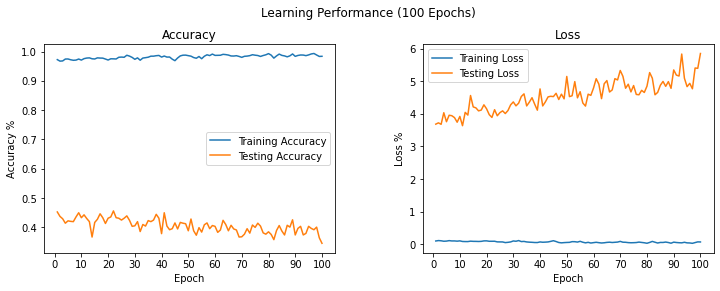

In [26]:
# Plot Accuracy and Loss 

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle('Learning Performance (100 Epochs)', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1,epochs+1,))
ax1.plot(epoch_list, history.history['accuracy'], label='Training Accuracy')
ax1.plot(epoch_list, history.history['val_accuracy'], label='Testing Accuracy')
ax1.set_xticks(np.arange(0, epochs+1, 10))
ax1.set_ylabel('Accuracy %')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Training Loss')
ax2.plot(epoch_list, history.history['val_loss'], label='Testing Loss')
ax2.set_xticks(np.arange(0, epochs+1, 10))
ax2.set_ylabel('Loss %')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

Well, this was not the expected result from using way more epochs! It didn't help at all. The model started off as good as it would get...Once again, while the epochs moved along, the Training Accuracy was improving while the Testing Accuracy remained around the same range. Another overfit model (increasingly so, in this case). 
##### The best way that I found to do this is with higher batch sizes -- it takes much longer to run and way more computing power but definitely gave better results

### Model Evaluation Metrics
#### How did the model do at predictions?

In [27]:
# Get accuracy of measure
correct = (target_labels == predictions)
accuracy = correct.sum() / correct.size
accuracy

0.3607142857142857

In [28]:
# # Evaluate Model Performance
# # pip install model_evaluation_utils
# from model_evaluation_utils import get_metrics

# get_metrics(true_labels=target_labels,
#             predicted_labels=predictions)

12. Plot Predictions against Actual Labels
To better visualize the prediction performance, I plotted out a small batch of the testing dataset with their actual labels and predictions made.

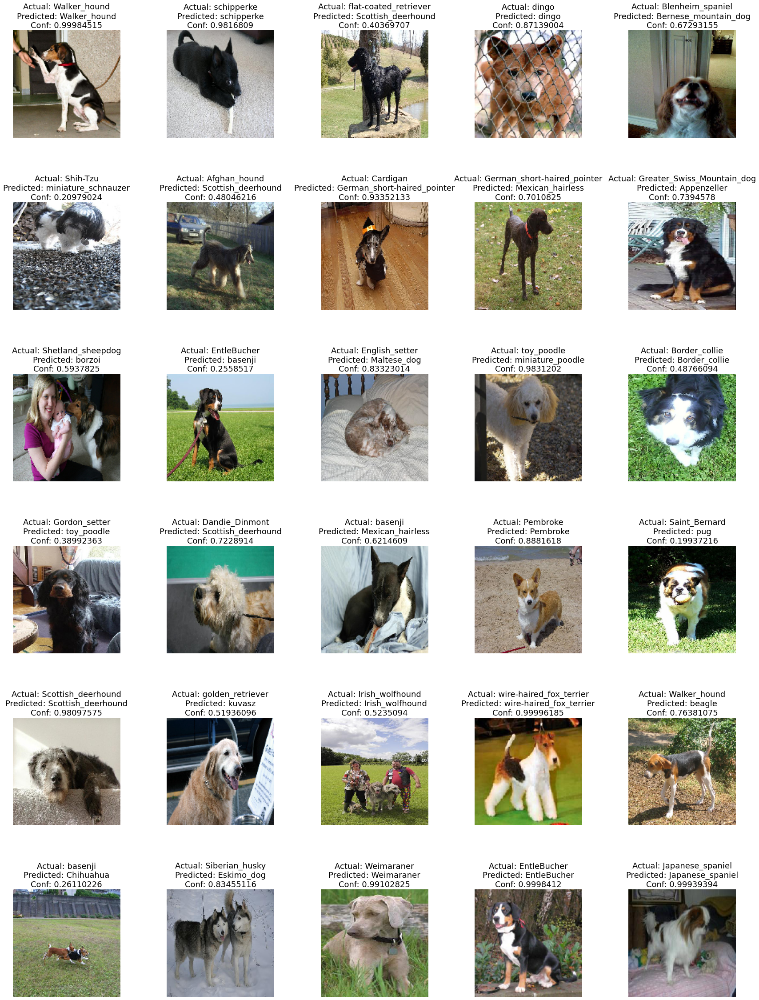

In [29]:
# Plot Actual vs Predicted Images with Confidence Levels
    
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)): # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(X_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredicted: ' + predicted + '\nConf: ' + conf, fontsize=18)
    
plt.show()

In [30]:
# model3.compile(Adam(lr=.0001), loss='categorical_crossentropy', metrics=['accuracy']) 
# model3.summary()

In [31]:
# tf.keras.utils.plot_model(
#     model,
#     show_shapes=True,
# )

In [32]:
# model3 = models.Sequential()
# # model.add(base_model) # add pre_trained layers
# model3.add(GlobalAveragePooling2D())
# model3.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
# model3.add(Dropout(0.3))
# model3.add(Dense(512, activation = 'relu'))
# model3.add(Dense(512, activation = 'relu'))
# model3.add(Dense(len(breeds), activation = 'softmax'))


# # Freeze pre-trained layers
# print('Number of trainable weights before freezing the base layer:', len(model.trainable_weights))
# model.layers[0].trainable = False
# print('Number of trainable weights after freezing the base layer:', len(model.trainable_weights))

### Conclusion
##### My best models overall was when using InceptionV3 with high batch sizes, which could predict breeds with over 90% accuracy. However, in the interest of time, I brought the batch size down to 32 so that I could experiment a little more frequently. 
##### Again, my best model(with smaller batch size) was using InceptionV3 as my pre-trained base layer, Global Pooling and Augmenting the images as I was using 7,000 for the final models. This provided about 70% accuracy when predicting the breed of a dog.

# Citations:
#### Dataset: http://vision.stanford.edu/aditya86/ImageNetDogs/
<br>InceptionV3: https://keras.io/api/applications/inceptionv3/
<br>TF Keras: https://www.tensorflow.org/api_docs/python/tf/keras
#### Assistance with coding:
Lesson 7.04
<br>https://machinelearningmastery.com/handwritten-digit-recognition-using-convolutional-neural-networks-python-keras/
<br>Then found this and it was extremely useful to help guide me through creating my own models: https://awesomeopensource.com/project/stormy-ua/dog-breeds-classification (examples of others doing the kaggle competitions/using a similar data set)
<br>(for example):https://www.kaggle.com/linhlpv/image-deteciton-dog-stanford

--------------------------------------
---------------------------
-------------------------------------
-----------------------------------

#### Additional notes, information and model examples/attempts:
##### A lot of experimentation went into this project. I have left the cells below included to show the first model that I attempted to fit/train as well as notes regarding all other methods of improving previous and future models. Leaving this in here as a reference, to show some additional work as I eventually just began editing each model above - and to have something to come back to and work on.

In [33]:
# Import libraries and modules
import numpy as np
import matplotlib.pyplot as plt

# For reproducibility
np.random.seed(42)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras import utils

In [34]:
# Instantiate a CNN.
cnn_model = Sequential()

In [35]:
# Attempting some things from lesson 7.04 here:
# Make sure each value is a float. (Otherwise, we get an error.)
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

In [36]:
# Add a convolutional layer.

cnn_model.add(Conv2D(filters=6,            # number of filters
                     kernel_size=(3, 3),        # height/width of filter
                     activation='relu',      # activation function 
                     input_shape=(28, 28, 1))) # shape of input (image)

In [37]:
cnn_model.add(MaxPooling2D(pool_size=(2, 2))) # dimensions of region of pooling

In [38]:
cnn_model.add(Conv2D(16,
                     kernel_size = (3, 3),
                     activation='relu'))

In [39]:
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

In [40]:
cnn_model.add(Flatten())

In [41]:
# Add a densely-connected layer with 128 neurons.
cnn_model.add(Dense(128, activation='relu'))

In [42]:
# Add a final layer with 10 neurons.
cnn_model.add(Dense(10, activation='softmax'))

In [43]:
# Compile model
cnn_model.compile(loss='categorical_crossentropy',
                  optimizer='adam',
                  metrics=['accuracy'])

In [45]:
# # Fit model on training data
# history1 = cnn_model.fit(X_train,
#                         y_ohe,
#                         batch_size=256,
#                         validation_data=(X_test, y_test),
#                         epochs=10,
#                         verbose=1)

In [51]:
# model3.add(Conv2D)
# model3.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
# model3.add(Dropout(0.3))
# model3.add(Dense(256, activation = 'relu'))
# model3.add(Dense(128, activation = 'relu'))
# model3.add(Dense(len(breeds), activation = 'softmax'))


# # Freeze pre-trained layers
# print('Number of trainable weights before freezing the base layer:', len(model.trainable_weights))
# model.layers[0].trainable = False
# print('Number of trainable weights after freezing the base layer:', len(model.trainable_weights))

In [52]:
# model3.compile(Adam(lr=.0001), loss='categorical_crossentropy', metrics=['accuracy']) 


In [53]:
# train_steps = X_train.shape[0] // batch_size
# val_steps = X_val.shape[0] // batch_size
# epochs = 20

# history3 = model3.fit_generator(train_generator,
#                              steps_per_epoch = train_steps,
#                              validation_data = val_generator,
#                              validation_steps = val_steps,
#                              epochs = epochs, verbose = 1)

In [54]:
# model3.summary()

In [50]:
# When just Flattening and adding a few layers, performance is so much worse..

In [55]:

# # Check shape of an image.
# X_train[0].shape

In [56]:

# # Make sure each value is a float. (Otherwise, we get an error.)
# X_train = X_train.astype('float32')
# X_test = X_test.astype('float32')

# # The current range of X_train and X_test is 0 to 255.
# # The code below is equivalent to X_train = X_train / 255.
# # This scales each value to be between 0 and 1.
# X_train /= 255
# X_test /= 255

In [ ]:
# # Check shape of full training data.
# X_train.shape
# # 4480 images @ 299 x 299 x 3(rgb)

In [ ]:
# img_data2 = np.array([img_to_array(load_img(img, target_size = (180,180)))
#                      for img in X]) # load, resize images, and store as array

In [ ]:
# # Reshape each image to be 28 x 28 x 1.
# # The 1 corresponds to the one black/white value.
# # If we had a color image, we would likely use 3 for RGB.
# X_train4 = X_train.reshape(X_train.shape[0], 28, 28, 3)
# X_test4 = X_test.reshape(X_test.shape[0], 28, 28, 3)

In [ ]:
# y_train[0:10]

In [ ]:
# import os
# import sys
# import urllib2

# import numpy as np
# import pandas as pd
# import tensorflow as tf

# from src.common import consts
# from src.data_preparation import dataset
# from src.freezing import freeze
# from src.common import paths


# def infer(model_name, img_raw):
#     with tf.Graph().as_default(), tf.Session().as_default() as sess:
#         tensors = freeze.unfreeze_into_current_graph(
#             os.path.join(paths.FROZEN_MODELS_DIR, model_name + '.pb'),
#             tensor_names=[consts.INCEPTION_INPUT_TENSOR, consts.OUTPUT_TENSOR_NAME])

#         _, one_hot_decoder = dataset.one_hot_label_encoder()

#         probs = sess.run(tensors[consts.OUTPUT_TENSOR_NAME],
#                          feed_dict={tensors[consts.INCEPTION_INPUT_TENSOR]: img_raw})

#         breeds = one_hot_decoder(np.identity(consts.CLASSES_COUNT)).reshape(-1)

#         # print(breeds)

#         df = pd.DataFrame(data={'prob': probs.reshape(-1), 'breed': breeds})


#         return df.sort_values(['prob'], ascending=False)


# def classify(resource_type, path):
#     if resource_type == 'uri':
#         response = urllib2.urlopen(path)
#         img_raw = response.read()
#     else:
#         with open(path, 'r') as f:
#             img_raw = f.read()

#     return infer(consts.CURRENT_MODEL_NAME, img_raw)
                                                            
# if __name__ == '__main__':
#     src = sys.argv[1]
#     path = sys.argv[2] # uri to a dog image to classify
#     probs = classify(src, path)

#     print(probs.sort_values(['prob'], ascending=False).take(range(5)))